In [23]:
import pandas as pd
import os
import glob
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

In [24]:
#converting csv files to pandas dataframes
# df_0 = pd.read_csv('california/CRMLSSold202412.csv')
df_1 = pd.read_csv('california/CRMLSSold202501_filled.csv')
df_2 = pd.read_csv('california/CRMLSSold202502.csv')
df_3 = pd.read_csv('california/CRMLSSold202503.csv')
df_4 = pd.read_csv('california/CRMLSSold202504.csv')
df_5 = pd.read_csv('california/CRMLSSold202505.csv')
df_6 = pd.read_csv('california/CRMLSSold202506.csv')

/var/folders/y8/mzq28ygd333_s7ffnk8_84cc0000gn/T/ipykernel_10538/263375428.py:8: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  df_6 = pd.read_csv('california/CRMLSSold202506.csv')


In [25]:
#dropping 2 extra columns
df_1 = df_1.drop(columns=['latfilled','lonfilled'])

In [26]:
#list with all the dfs as elements in chronological order
# all_dfs = [df_0,df_1,df_2,df_3,df_4,df_5]
all_dfs = [df_1,df_2,df_3,df_4,df_5,df_6]

In [28]:
df = pd.concat(all_dfs)

In [29]:
important_features = [
    'BedroomsTotal',
    'BathroomsTotalInteger',
    'LivingArea',
    'LotSizeAcres',              
    'GarageSpaces',
    'YearBuilt',
    'Stories',
    'PostalCode',
    'City',
    'StateOrProvince',
    'Latitude',
    'Longitude',
    'PropertyType',
    'PropertySubType',
    'PoolPrivateYN', 
    'FireplaceYN'
]

In [30]:
excluded_features = [
    'ListPrice',
    'OriginalListPrice',
    'CloseDate',
    'ListAgentEmail',
    'ListAgentFirstName',
    'ListAgentLastName',
    'ListAgentFullName',
    'ListAgentAOR',
    'BuyerAgentFirstName',
    'BuyerAgentLastName',
    'BuyerAgentMlsId',
    'BuyerAgentAOR',
    'BuyerOfficeAOR',
    'BuyerOfficeName',
    'BuyerAgencyCompensation',
    'BuyerAgencyCompensationType',
    'ListOfficeName',
    'CoListOfficeName',
    'CoListAgentFirstName',
    'CoListAgentLastName',
    'CoBuyerAgentFirstName',
    'ContractStatusChangeDate',
    'ListingContractDate',
    'PurchaseContractDate',
    'MlsStatus',
    'ListingId',
    'ListingKey',
    'ListingKeyNumeric',
    'BusinessType',
    'ElementarySchool',
    'MiddleOrJuniorSchool',
    'HighSchool',
    'MLSAreaMajor',
    'SubdivisionName',
    'TaxYear',
    'TaxAnnualAmount',
    'AssociationFee',
    'AssociationFeeFrequency',
    'UnparsedAddress',
    'StreetNumberNumeric',
    'BelowGradeFinishedArea',
    'CoveredSpaces',
    'FireplacesTotal',
    'Levels',
    'BuilderName',
    'NewConstructionYN',
    'DaysOnMarket',
    'latfilled',
    'lonfilled'
]

In [31]:
keep_cols = important_features + ['ClosePrice']

In [32]:
df_model = df[keep_cols].copy()

In [40]:
print("\nMissing values in model input:")
print(df_model.isnull().sum().sort_values(ascending=False))


Missing values in model input:
Stories                  24580
GarageSpaces             17280
PoolPrivateYN            15005
FireplaceYN              11248
LotSizeAcres             11216
PropertySubType           9978
LivingArea                9241
BedroomsTotal             8621
BathroomsTotalInteger     5927
YearBuilt                 5704
City                       101
PostalCode                  29
Latitude                    23
Longitude                   18
ClosePrice                   2
PropertyType                 0
StateOrProvince              0
dtype: int64


In [42]:
df_model = df_model[df_model['ClosePrice'].notna()].copy()

In [45]:
print("\nMissing values in model input:")
print(df_model.isnull().sum().sort_values(ascending=False))


Missing values in model input:
Stories                  24579
GarageSpaces             17279
PoolPrivateYN            15004
FireplaceYN              11247
LotSizeAcres             11216
PropertySubType           9977
LivingArea                9240
BedroomsTotal             8620
BathroomsTotalInteger     5927
YearBuilt                 5704
City                       101
PostalCode                  29
Latitude                    23
Longitude                   18
PropertyType                 0
StateOrProvince              0
ClosePrice                   0
dtype: int64


In [47]:
missing_stories = df_model[df_model['Stories'].isna()]
missing_stories

,BedroomsTotal,BathroomsTotalInteger,LivingArea,LotSizeAcres,GarageSpaces,YearBuilt,Stories,PostalCode,City,StateOrProvince,Latitude,Longitude,PropertyType,PropertySubType,PoolPrivateYN,FireplaceYN,ClosePrice
0,NaN,NaN,NaN,0.7886,NaN,NaN,NaN,90031,Los Angeles,CA,34.092730,-118.196598,Land,NaN,NaN,NaN,442000.0
1,5.0,5.0,4996.0,0.1312,NaN,1928.0,NaN,90402,Santa Monica,CA,34.021955,-118.509545,ResidentialLease,SingleFamilyResidence,True,True,45000.0
3,NaN,NaN,NaN,5.0000,NaN,NaN,NaN,92307,Apple Valley,CA,34.580058,-117.168463,Land,NaN,NaN,NaN,100000.0
4,4.0,4.0,3019.0,0.1200,3.0,1979.0,NaN,92270,Rancho Mirage,CA,33.767566,-116.420509,ResidentialLease,SingleFamilyResidence,True,True,8500.0
5,NaN,NaN,NaN,4.0600,NaN,NaN,NaN,92504,Riverside,CA,33.880830,-117.401952,Land,NaN,NaN,NaN,1100000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22874,NaN,0.0,NaN,2.0000,NaN,NaN,NaN,92371,Phelan,CA,34.445320,-117.538125,Land,NaN,NaN,NaN,50000.0
22875,NaN,NaN,NaN,28.7700,NaN,NaN,NaN,92591,Temecula,CA,33.548940,-117.060412,Land,NaN,NaN,NaN,757500.0
22877,NaN,NaN,NaN,4.7600,NaN,NaN,NaN,92532,Lake Elsinore,CA,33.720011,-117.334589,Land,NaN,NaN,NaN,129000.0
22878,NaN,0.0,NaN,11.8300,NaN,NaN,NaN,95070,Saratoga,CA,37.261483,-122.004468,Land,NaN,NaN,NaN,35000000.0


In [49]:
# Drop 'Stories'
df_model.drop(columns=['Stories'], inplace=True)

# Fill with 0
df_model['GarageSpaces'] = df_model['GarageSpaces'].fillna(0)

# Fill with median
df_model['LotSizeAcres'] = df_model['LotSizeAcres'].fillna(df_model['LotSizeAcres'].median())
df_model['LivingArea'] = df_model['LivingArea'].fillna(df_model['LivingArea'].median())
df_model['BedroomsTotal'] = df_model['BedroomsTotal'].fillna(df_model['BedroomsTotal'].median())
df_model['BathroomsTotalInteger'] = df_model['BathroomsTotalInteger'].fillna(df_model['BathroomsTotalInteger'].median())
df_model['YearBuilt'] = df_model['YearBuilt'].fillna(df_model['YearBuilt'].median())

# Fill with categorical modes or defaults
df_model['City'] = df_model['City'].fillna(df_model['City'].mode()[0])
df_model['PostalCode'] = df_model['PostalCode'].fillna(df_model['PostalCode'].mode()[0])
df_model['StateOrProvince'] = df_model['StateOrProvince'].fillna('CA')
df_model['PropertySubType'] = df_model['PropertySubType'].fillna('SingleFamilyResidence')

# Drop rows with missing lat/lon (only ~1k)
df_model.dropna(subset=['Latitude', 'Longitude'], inplace=True)

In [51]:
print("\nMissing values in model input:")
print(df_model.isnull().sum().sort_values(ascending=False))


Missing values in model input:
PoolPrivateYN            14993
FireplaceYN              11238
BedroomsTotal                0
BathroomsTotalInteger        0
LivingArea                   0
LotSizeAcres                 0
GarageSpaces                 0
YearBuilt                    0
PostalCode                   0
City                         0
StateOrProvince              0
Latitude                     0
Longitude                    0
PropertyType                 0
PropertySubType              0
ClosePrice                   0
dtype: int64


95th percentile: $2,522,205


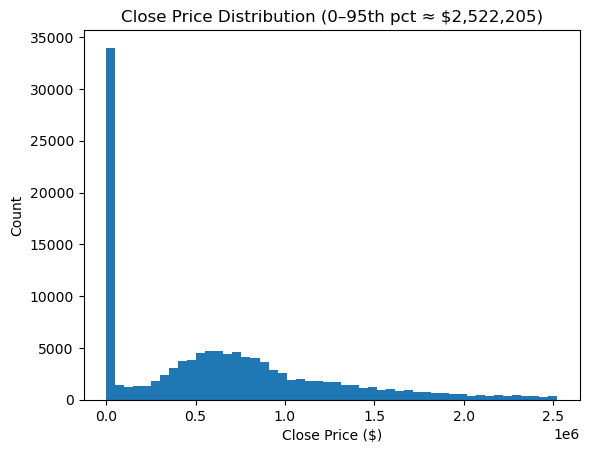

In [53]:
p95 = df_model['ClosePrice'].quantile(0.95)
print(f"95th percentile: ${p95:,.0f}")
plt.figure()
plt.hist(df_model['ClosePrice'], bins=50, range=(0, p95))
plt.title(f'Close Price Distribution (0–95th pct ≈ ${p95:,.0f})')
plt.xlabel('Close Price ($)')
plt.ylabel('Count')
plt.show()

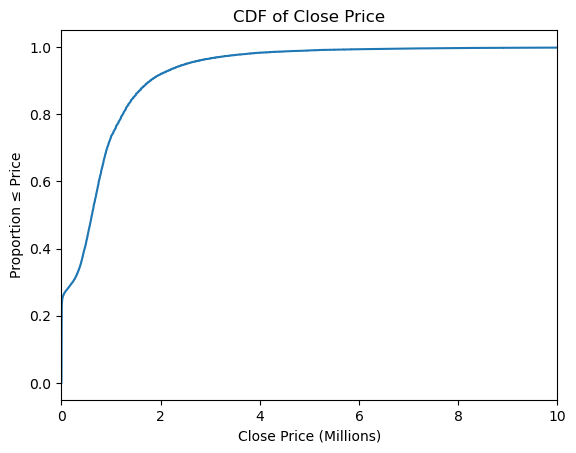

In [54]:
prices = np.sort(df_model['ClosePrice'])
cdf = np.arange(len(prices)) / float(len(prices))

plt.figure()
plt.plot(prices/1e6, cdf)
plt.title('CDF of Close Price')
plt.xlabel('Close Price (Millions)')
plt.ylabel('Proportion ≤ Price')
plt.xlim(0,10)
plt.show()

/opt/anaconda3/lib/python3.12/site-packages/numpy/core/function_base.py:158: RuntimeWarning: invalid value encountered in multiply
  y *= step
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
/opt/anaconda3/lib/python3.12/site-packages/matplotlib/mlab.py:905: RuntimeWarning: invalid value encountered in subtract
  diff = self.dataset - points[:, i, np.newaxis]


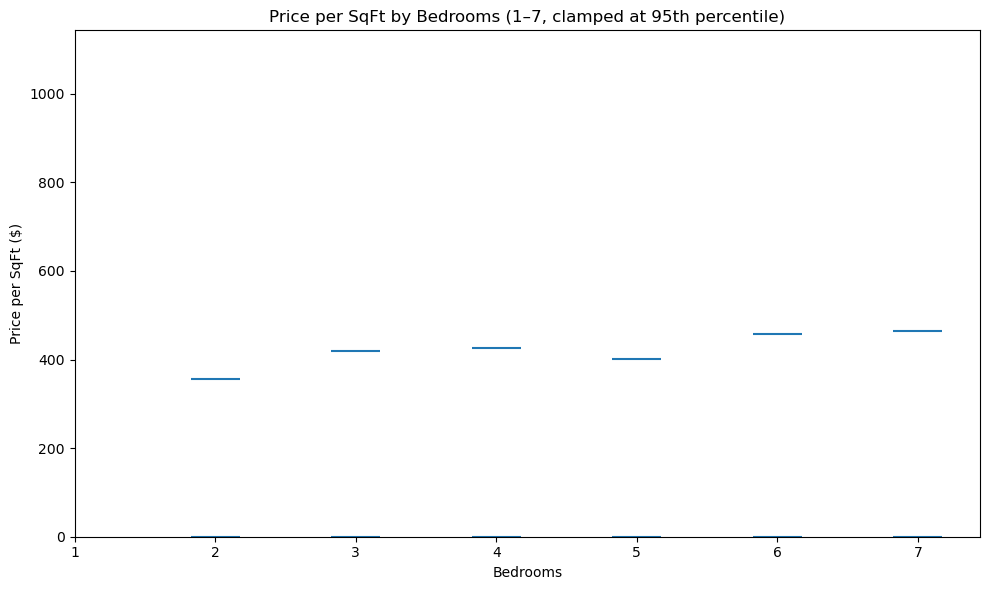

In [57]:
if 'PricePerSqFt' not in df_model:
    df_model['PricePerSqFt'] = df_model['ClosePrice'] / df_model['LivingArea']

beds = [b for b in sorted(df_model['BedroomsTotal'].dropna().unique()) if 1 <= b <= 7]
data = [df_model.loc[df_model['BedroomsTotal'] == b, 'PricePerSqFt'] for b in beds]

p95 = df_model['PricePerSqFt'].quantile(0.95)

plt.figure(figsize=(10, 6))
plt.violinplot(data,
               positions=beds,
               showmedians=True,
               widths=0.7)
plt.ylim(0, p95)
plt.xticks(beds)
plt.xlabel('Bedrooms')
plt.ylabel('Price per SqFt ($)')
plt.title('Price per SqFt by Bedrooms (1–7, clamped at 95th percentile)')
plt.tight_layout()
plt.show()

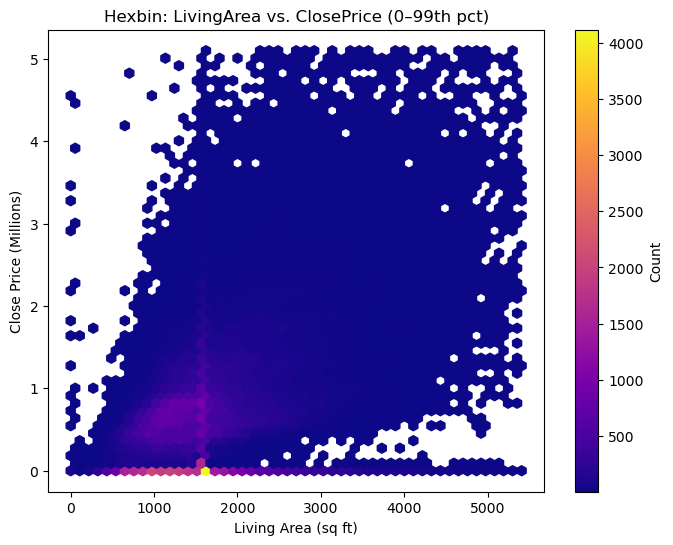

In [58]:
price_cut = df_model['ClosePrice'].quantile(0.99)
area_cut  = df_model['LivingArea'].quantile(0.99)

df_trim = df_model[
    (df_model['ClosePrice'] <= price_cut) &
    (df_model['LivingArea'] <= area_cut)
]

plt.figure(figsize=(8,6))
hb = plt.hexbin(
    df_trim['LivingArea'],
    df_trim['ClosePrice'] / 1e6,
    gridsize=50,
    mincnt=1,
    cmap='plasma'
)
plt.title('Hexbin: LivingArea vs. ClosePrice (0–99th pct)')
plt.xlabel('Living Area (sq ft)')
plt.ylabel('Close Price (Millions)')
cb = plt.colorbar(hb)
cb.set_label('Count')
plt.show()

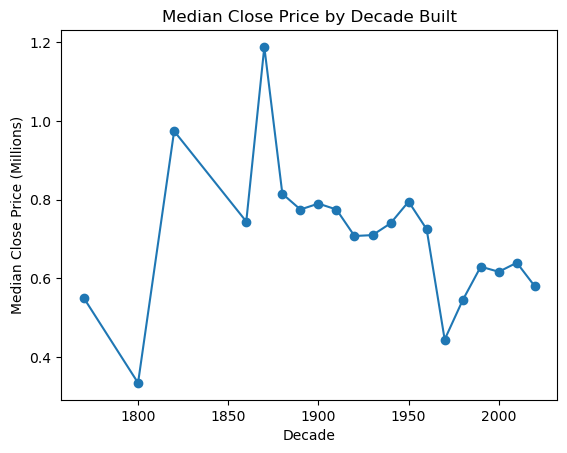

In [61]:
df_model['BuiltDecade'] = (df_model['YearBuilt'] // 10) * 10
decade_median = df_model.groupby('BuiltDecade')['ClosePrice'].median() / 1e6

plt.figure()
plt.plot(decade_median.index, decade_median.values, marker='o')
plt.title('Median Close Price by Decade Built')
plt.xlabel('Decade')
plt.ylabel('Median Close Price (Millions)')
plt.show()

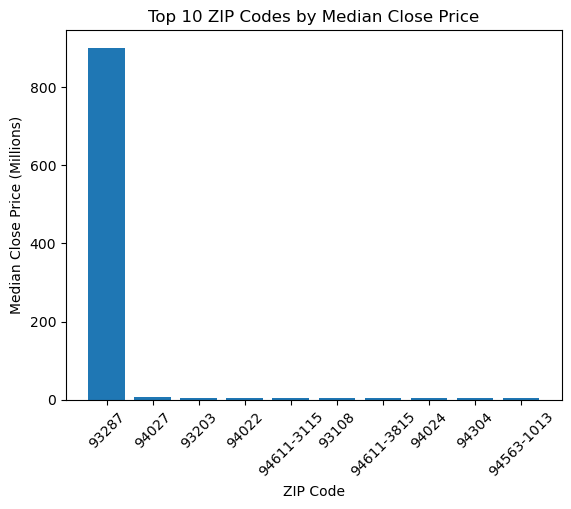

In [63]:
zip_med = df_model.groupby('PostalCode')['ClosePrice'].median().sort_values(ascending=False).head(10) / 1e6

plt.figure()
plt.bar(zip_med.index, zip_med.values)
plt.title('Top 10 ZIP Codes by Median Close Price')
plt.xlabel('ZIP Code')
plt.ylabel('Median Close Price (Millions)')
plt.xticks(rotation=45)
plt.show()

Top 6 features most correlated with ClosePrice:
BathroomsTotalInteger    0.093209
BedroomsTotal            0.079599
GarageSpaces             0.017676
Longitude                0.014576
Latitude                 0.010855
LivingArea               0.002575
Name: ClosePrice, dtype: float64


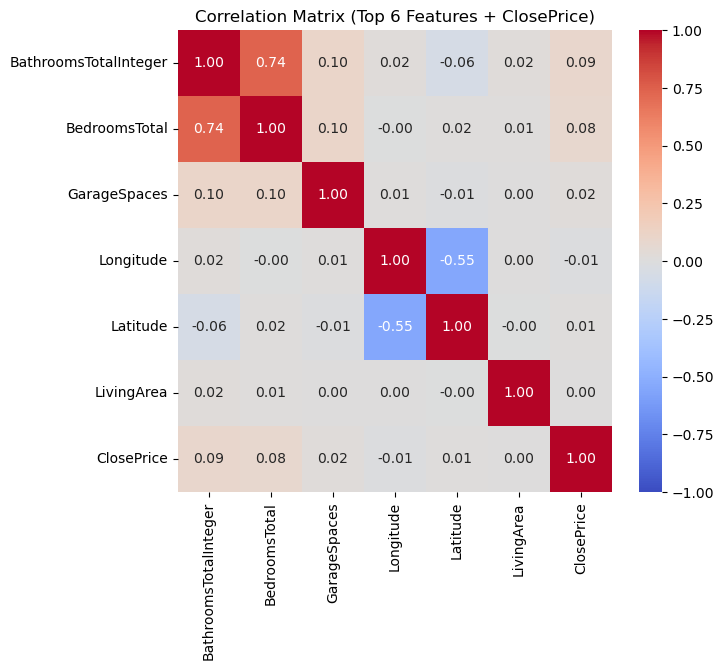

In [65]:
import matplotlib.pyplot as plt
import seaborn as sns

corr_matrix = df_model.drop(columns=['PricePerSqFt'], errors='ignore').corr(numeric_only=True)

target_corr = corr_matrix['ClosePrice'].drop('ClosePrice')

top6 = target_corr.abs().sort_values(ascending=False).head(6)
print("Top 6 features most correlated with ClosePrice:")
print(top6)

cols_to_plot = top6.index.tolist() + ['ClosePrice']

small_corr = df_model[cols_to_plot].corr()

plt.figure(figsize=(7, 6))
sns.heatmap(
    small_corr,
    annot=True,
    fmt=".2f",
    cmap='coolwarm',
    vmin=-1,
    vmax=1
)
plt.title('Correlation Matrix (Top 6 Features + ClosePrice)')
plt.show()


Training model on log-transformed prices...
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=PropertyType,City,PostalCode, categorical_column=3,4,5 will be ignored. Current value: categorical_feature=PropertyType,City,PostalCode
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000687 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2313
[LightGBM] [Info] Number of data points in the train set: 100580, number of used features: 6
[LightGBM] [Info] Start training from score 2.505769
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

/opt/anaconda3/lib/python3.12/site-packages/lightgbm/basic.py:2137: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  _log_warning(
/opt/anaconda3/lib/python3.12/site-packages/lightgbm/basic.py:2159: UserWarning: categorical_feature in param dict is overridden.
  _log_warning(f"{cat_alias} in param dict is overridden.")


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

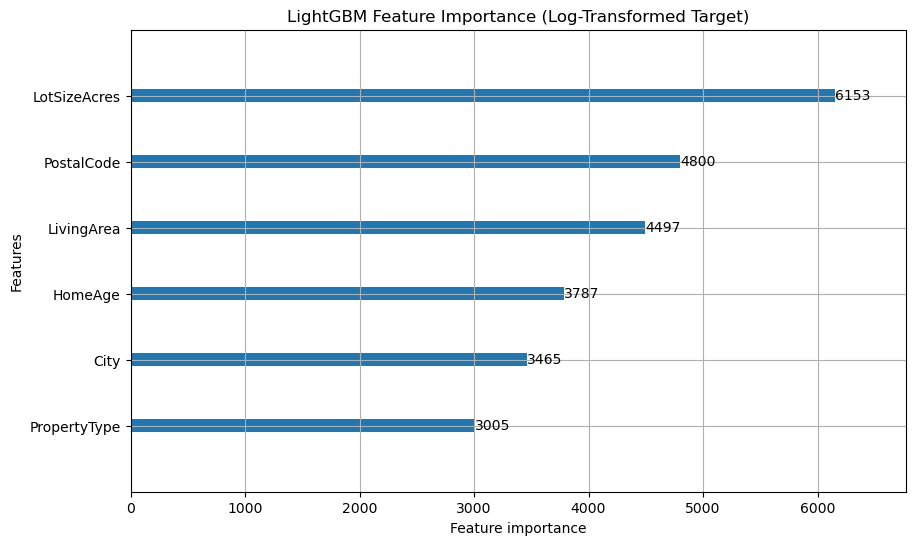


Sample Predictions vs Actuals:
          Actual     Predicted
8396   1350000.0  1.278961e+06
11656  1675000.0  2.043226e+06
1159    749000.0  8.376297e+05
4878      2609.0  2.501645e+03
13320   525000.0  4.526425e+05
17359   640000.0  6.733017e+05
6874      5600.0  5.212220e+03
6428   3750000.0  3.946903e+06
9321    765000.0  7.235794e+05
248       5250.0  6.037283e+03


In [67]:
# Import libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import lightgbm as lgb
import matplotlib.pyplot as plt

# Remove top/bottom 1% of prices
price_limits = df_model['ClosePrice'].quantile([0.01, 0.99])
df_model = df_model[df_model['ClosePrice'].between(*price_limits)]

# Feature engineering
df_model['HomeAge'] = 2025 - df_model['YearBuilt']

# Define key features
numeric_features = [
    'LivingArea', 
    'LotSizeAcres', 'HomeAge'
]
categorical_features = [
    'PropertyType', 'City', 'PostalCode'
]
target = 'ClosePrice'

# Preprocessing
# Convert categoricals to pandas 'category' dtype
for col in categorical_features:
    df_model[col] = df_model[col].astype('category')

# Apply log transformation to target variable
y_log = np.log1p(df_model[target])  # Using log1p to handle zeros

# Split data into train/test
X = df_model[numeric_features + categorical_features]
X_train, X_test, y_train_log, y_test_log = train_test_split(X, y_log, test_size=0.2, random_state=42)

# Initialize and train LightGBM model

model = lgb.LGBMRegressor(
    n_estimators=1000,           # Increased from 200
    learning_rate=0.05,          # Reduced from 0.1
    max_depth=5,                 # Increased from 3
    min_child_samples=20,        # Reduced from 50
    reg_alpha=0.1,               # L1 regularization
    reg_lambda=0.1,              # L2 regularization
    categorical_feature=categorical_features,
    random_state=42,
    objective='tweedie'          # Better for right-skewed data
)

print("\nTraining model on log-transformed prices...")
model.fit(X_train, y_train_log)

# Predictions (in log space)
y_pred_log = model.predict(X_test)

# Convert predictions back to original scale
y_pred = np.expm1(y_pred_log)
y_test = np.expm1(y_test_log)

# Evaluate
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mape = mean_absolute_percentage_error(y_test, y_pred) * 100
r2 = r2_score(y_test, y_pred)

print("\nModel Performance:")
print(f"RMSE: {rmse:.2f}")
print(f"MAPE: {mape:.2f}%")
print(f"R²: {r2:.4f}")

# Feature Importance
print("\nPlotting feature importance...")
lgb.plot_importance(model, figsize=(10, 6), max_num_features=20)
plt.title("LightGBM Feature Importance (Log-Transformed Target)")
plt.show()

# Compare predictions vs actuals
results = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
print("\nSample Predictions vs Actuals:")
print(results.head(10))

In [69]:
# Compare predictions vs actuals
results = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
print(results.head(10))

# Check for extreme values
print("Max prediction:", y_pred.max())
print("Min prediction:", y_pred.min())

          Actual     Predicted
8396   1350000.0  1.278961e+06
11656  1675000.0  2.043226e+06
1159    749000.0  8.376297e+05
4878      2609.0  2.501645e+03
13320   525000.0  4.526425e+05
17359   640000.0  6.733017e+05
6874      5600.0  5.212220e+03
6428   3750000.0  3.946903e+06
9321    765000.0  7.235794e+05
248       5250.0  6.037283e+03
Max prediction: 6732407.384357134
Min prediction: 1651.5394757900433


In [72]:
from sklearn.model_selection import KFold

kf = KFold(n_splits=5)
cv_scores = []

for train_idx, val_idx in kf.split(X):
    X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
    y_train, y_val = y_log.iloc[train_idx], y_log.iloc[val_idx]
    
    model.fit(X_train, y_train)
    preds = np.expm1(model.predict(X_val))
    cv_scores.append(mean_absolute_percentage_error(np.expm1(y_val), preds))

print(f"\nCross-Validated MAPE: {np.mean(cv_scores)*100:.2f}% (±{np.std(cv_scores)*100:.2f}%)")

/opt/anaconda3/lib/python3.12/site-packages/lightgbm/basic.py:2137: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  _log_warning(
/opt/anaconda3/lib/python3.12/site-packages/lightgbm/basic.py:2159: UserWarning: categorical_feature in param dict is overridden.
  _log_warning(f"{cat_alias} in param dict is overridden.")


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=PropertyType,City,PostalCode, categorical_column=3,4,5 will be ignored. Current value: categorical_feature=PropertyType,City,PostalCode
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2306
[LightGBM] [Info] Number of data points in the train set: 100580, number of used features: 6
[LightGBM] [Info] Start training from score 2.514230
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

/opt/anaconda3/lib/python3.12/site-packages/lightgbm/basic.py:2137: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  _log_warning(
/opt/anaconda3/lib/python3.12/site-packages/lightgbm/basic.py:2159: UserWarning: categorical_feature in param dict is overridden.
  _log_warning(f"{cat_alias} in param dict is overridden.")


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=PropertyType,City,PostalCode, categorical_column=3,4,5 will be ignored. Current value: categorical_feature=PropertyType,City,PostalCode
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2305
[LightGBM] [Info] Number of data points in the train set: 100580, number of used features: 6
[LightGBM] [Info] Start training from score 2.503847
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

/opt/anaconda3/lib/python3.12/site-packages/lightgbm/basic.py:2137: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  _log_warning(
/opt/anaconda3/lib/python3.12/site-packages/lightgbm/basic.py:2159: UserWarning: categorical_feature in param dict is overridden.
  _log_warning(f"{cat_alias} in param dict is overridden.")


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=PropertyType,City,PostalCode, categorical_column=3,4,5 will be ignored. Current value: categorical_feature=PropertyType,City,PostalCode
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000769 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2303
[LightGBM] [Info] Number of data points in the train set: 100580, number of used features: 6
[LightGBM] [Info] Start training from score 2.502512
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

/opt/anaconda3/lib/python3.12/site-packages/lightgbm/basic.py:2137: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  _log_warning(
/opt/anaconda3/lib/python3.12/site-packages/lightgbm/basic.py:2159: UserWarning: categorical_feature in param dict is overridden.
  _log_warning(f"{cat_alias} in param dict is overridden.")


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=PropertyType,City,PostalCode, categorical_column=3,4,5 will be ignored. Current value: categorical_feature=PropertyType,City,PostalCode
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000464 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2300
[LightGBM] [Info] Number of data points in the train set: 100580, number of used features: 6
[LightGBM] [Info] Start training from score 2.503512
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

/opt/anaconda3/lib/python3.12/site-packages/lightgbm/basic.py:2137: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  _log_warning(
/opt/anaconda3/lib/python3.12/site-packages/lightgbm/basic.py:2159: UserWarning: categorical_feature in param dict is overridden.
  _log_warning(f"{cat_alias} in param dict is overridden.")


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=PropertyType,City,PostalCode, categorical_column=3,4,5 will be ignored. Current value: categorical_feature=PropertyType,City,PostalCode
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000517 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2283
[LightGBM] [Info] Number of data points in the train set: 100580, number of used features: 6
[LightGBM] [Info] Start training from score 2.503804
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

/var/folders/y8/mzq28ygd333_s7ffnk8_84cc0000gn/T/ipykernel_29966/2409775401.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['HomeAge'] = 2025 - df['YearBuilt']
/var/folders/y8/mzq28ygd333_s7ffnk8_84cc0000gn/T/ipykernel_29966/2409775401.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['LargeLot'] = (df['LotSizeAcres'] > 0.5).astype('category')
[I 2025-07-24 17:36:41,076] A new study created in memory with name: no-name-90b3f355-fc97-4d97-9cc3-429e91580bb2


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	valid_0's mape: 0.0158444
[100]	valid_0's mape: 0.0155153
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[I 2025-07-24 17:36:53,676] Trial 0 finished with value: 0.19810297218257444 and parameters: {'n_estimators': 1062, 'learning_rate': 0.1667521176194013, 'max_depth': 10, 'num_leaves': 126, 'min_child_samples': 19, 'reg_alpha': 0.15599452033620265, 'reg_lambda': 0.05808361216819946, 'subsample': 0.9464704583099741, 'colsample_bytree': 0.8404460046972835, 'tweedie_variance_power': 1.6664580622368363}. Best is trial 0 with value: 0.19810297218257444.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000419 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
Training until validation scores don't improve for 50 rounds
[50]	valid_0's mape: 0.016062
[100]	valid_0's mape: 0.0156428
[150]	valid_0's mape: 0.0155034
[200]	valid_0's mape: 0.0154341
[250]	valid_0's mape: 0.0153698
[300]	valid_0's mape: 0.0153326
[350]	valid_0's mape: 0.0153034
[400]	valid_0's mape: 0.0152822
[450]	valid_0's mape: 0.0152657
Early stopping, b

[I 2025-07-24 17:37:02,063] Trial 1 finished with value: 0.1997629659435289 and parameters: {'n_estimators': 530, 'learning_rate': 0.17898794163735263, 'max_depth': 11, 'num_leaves': 54, 'min_child_samples': 22, 'reg_alpha': 0.18340450985343382, 'reg_lambda': 0.3042422429595377, 'subsample': 0.8099025726528951, 'colsample_bytree': 0.7727780074568463, 'tweedie_variance_power': 1.3329833121584336}. Best is trial 0 with value: 0.19810297218257444.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000375 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2025-07-24 17:37:14,491] Trial 2 finished with value: 0.22402708007174732 and parameters: {'n_estimators': 1418, 'learning_rate': 0.008364645453054504, 'max_depth': 5, 'num_leaves': 83, 'min_child_samples': 48, 'reg_alpha': 0.7851759613930136, 'reg_lambda': 0.19967378215835974, 'subsample': 0.8056937753654446, 'colsample_bytree': 0.836965827544817, 'tweedie_variance_power': 1.1371603301759983}. Best is trial 0 with value: 0.19810297218257444.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2025-07-24 17:37:20,802] Trial 3 finished with value: 0.2439235844276488 and parameters: {'n_estimators': 1411, 'learning_rate': 0.009379072229909205, 'max_depth': 3, 'num_leaves': 191, 'min_child_samples': 97, 'reg_alpha': 0.8083973481164611, 'reg_lambda': 0.3046137691733707, 'subsample': 0.6390688456025535, 'colsample_bytree': 0.8736932106048627, 'tweedie_variance_power': 1.452121994991681}. Best is trial 0 with value: 0.19810297218257444.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2025-07-24 17:37:23,725] Trial 4 finished with value: 0.22906971525395725 and parameters: {'n_estimators': 683, 'learning_rate': 0.031065126086242026, 'max_depth': 3, 'num_leaves': 184, 'min_child_samples': 29, 'reg_alpha': 0.662522284353982, 'reg_lambda': 0.31171107608941095, 'subsample': 0.8080272084711243, 'colsample_bytree': 0.8186841117373118, 'tweedie_variance_power': 1.2478835644204216}. Best is trial 0 with value: 0.19810297218257444.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2025-07-24 17:37:47,450] Trial 5 finished with value: 0.1988277527164556 and parameters: {'n_estimators': 1955, 'learning_rate': 0.08725278311502205, 'max_depth': 12, 'num_leaves': 181, 'min_child_samples': 62, 'reg_alpha': 0.9218742350231168, 'reg_lambda': 0.0884925020519195, 'subsample': 0.678393144967658, 'colsample_bytree': 0.6180909155642152, 'tweedie_variance_power': 1.3602642646106116}. Best is trial 0 with value: 0.19810297218257444.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2025-07-24 17:38:07,063] Trial 6 finished with value: 0.21132953492008352 and parameters: {'n_estimators': 1083, 'learning_rate': 0.013604651830782358, 'max_depth': 11, 'num_leaves': 81, 'min_child_samples': 31, 'reg_alpha': 0.5426960831582485, 'reg_lambda': 0.14092422497476265, 'subsample': 0.9208787923016158, 'colsample_bytree': 0.6298202574719083, 'tweedie_variance_power': 1.8895095492804137}. Best is trial 0 with value: 0.19810297218257444.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000597 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2025-07-24 17:38:13,870] Trial 7 finished with value: 0.23470901898226418 and parameters: {'n_estimators': 1659, 'learning_rate': 0.01040697346842838, 'max_depth': 3, 'num_leaves': 166, 'min_child_samples': 72, 'reg_alpha': 0.7290071680409873, 'reg_lambda': 0.7712703466859457, 'subsample': 0.6296178606936361, 'colsample_bytree': 0.7433862914177091, 'tweedie_variance_power': 1.1926952476201038}. Best is trial 0 with value: 0.19810297218257444.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000422 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
Training until validation scores don't improve for 50 rounds
[50]	valid_0's mape: 0.0263803
[100]	valid_0's mape: 0.0181894
[150]	valid_0's mape: 0.0170018
[200]	valid_0's mape: 0.0165177
[250]	valid_0's mape: 0.0162722
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[300]	valid_0's mape: 0.0161318
[350]	valid_0's mape: 0.016003
[400]	

[I 2025-07-24 17:38:28,900] Trial 8 finished with value: 0.20122980710894336 and parameters: {'n_estimators': 1795, 'learning_rate': 0.04983460221146937, 'max_depth': 6, 'num_leaves': 26, 'min_child_samples': 34, 'reg_alpha': 0.32518332202674705, 'reg_lambda': 0.7296061783380641, 'subsample': 0.8550229885420852, 'colsample_bytree': 0.9548850970305306, 'tweedie_variance_power': 1.4777719401295595}. Best is trial 0 with value: 0.19810297218257444.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000573 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2025-07-24 17:38:41,263] Trial 9 finished with value: 0.2014374846552216 and parameters: {'n_estimators': 679, 'learning_rate': 0.0694433945478456, 'max_depth': 10, 'num_leaves': 119, 'min_child_samples': 79, 'reg_alpha': 0.49379559636439074, 'reg_lambda': 0.5227328293819941, 'subsample': 0.7710164073434198, 'colsample_bytree': 0.610167650697638, 'tweedie_variance_power': 1.1863131415946437}. Best is trial 0 with value: 0.19810297218257444.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
Training until validation scores don't improve for 50 rounds
[50]	valid_0's mape: 0.0160394
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[100]	valid_0's mape: 0.0155931
[150]	valid_0's mape: 0.0154697
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[200]	valid_0's mape: 0.0154195
[250]	valid_0's mape: 0.01

[I 2025-07-24 17:38:55,270] Trial 10 finished with value: 0.20088432815105658 and parameters: {'n_estimators': 1062, 'learning_rate': 0.15612443937329373, 'max_depth': 9, 'num_leaves': 136, 'min_child_samples': 6, 'reg_alpha': 0.038725199961183066, 'reg_lambda': 0.95977074594542, 'subsample': 0.990455959943198, 'colsample_bytree': 0.9787847505560597, 'tweedie_variance_power': 1.6907244357800166}. Best is trial 0 with value: 0.19810297218257444.


Early stopping, best iteration is:
[480]	valid_0's mape: 0.0149126
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2025-07-24 17:39:13,221] Trial 11 finished with value: 0.19785450453707387 and parameters: {'n_estimators': 1989, 'learning_rate': 0.10204731270631616, 'max_depth': 12, 'num_leaves': 153, 'min_child_samples': 65, 'reg_alpha': 0.9442767878285697, 'reg_lambda': 0.00687859033873954, 'subsample': 0.7071131857249132, 'colsample_bytree': 0.7052449650598276, 'tweedie_variance_power': 1.6404641433860938}. Best is trial 11 with value: 0.19785450453707387.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000537 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2025-07-24 17:39:27,420] Trial 12 finished with value: 0.1985293950596092 and parameters: {'n_estimators': 1043, 'learning_rate': 0.11865959565248248, 'max_depth': 8, 'num_leaves': 144, 'min_child_samples': 56, 'reg_alpha': 0.9904243998401614, 'reg_lambda': 0.003129195969828585, 'subsample': 0.7371197153065265, 'colsample_bytree': 0.7019796076799771, 'tweedie_variance_power': 1.6799431128929232}. Best is trial 11 with value: 0.19785450453707387.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2025-07-24 17:40:12,129] Trial 13 finished with value: 0.19637070747881702 and parameters: {'n_estimators': 1313, 'learning_rate': 0.03467105331555227, 'max_depth': 12, 'num_leaves': 148, 'min_child_samples': 9, 'reg_alpha': 0.3100372271056015, 'reg_lambda': 0.01314031571780827, 'subsample': 0.9045436922164887, 'colsample_bytree': 0.903345419572595, 'tweedie_variance_power': 1.6414122087482788}. Best is trial 13 with value: 0.19637070747881702.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2025-07-24 17:41:23,743] Trial 14 finished with value: 0.196099305137027 and parameters: {'n_estimators': 1997, 'learning_rate': 0.0258242245548792, 'max_depth': 12, 'num_leaves': 152, 'min_child_samples': 47, 'reg_alpha': 0.3849491018344544, 'reg_lambda': 0.4189418837326904, 'subsample': 0.7106371743689446, 'colsample_bytree': 0.9190928395303577, 'tweedie_variance_power': 1.5856856760590075}. Best is trial 14 with value: 0.196099305137027.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
Training until validation scores don't improve for 50 rounds
[50]	valid_0's mape: 0.0737987
[100]	valid_0's mape: 0.0345844
[150]	valid_0's mape: 0.0210892
[200]	valid_0's mape: 0.0177997
[250]	valid_0's mape: 0.0167702
[300]	valid_0's mape: 0.0163123
[350]	valid_0's mape: 0.0160902
[400]	valid_0's mape: 0.0159551
[450]	valid_0's mape: 0.0158459
[500]	valid_0's 

[I 2025-07-24 17:42:05,648] Trial 15 finished with value: 0.1979026392445781 and parameters: {'n_estimators': 1595, 'learning_rate': 0.02066115656686591, 'max_depth': 12, 'num_leaves': 94, 'min_child_samples': 5, 'reg_alpha': 0.40511712073150635, 'reg_lambda': 0.49592046516657956, 'subsample': 0.8873928247740285, 'colsample_bytree': 0.9155971688965128, 'tweedie_variance_power': 1.8102195766689138}. Best is trial 14 with value: 0.196099305137027.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2025-07-24 17:42:30,861] Trial 16 finished with value: 0.2200879068054571 and parameters: {'n_estimators': 1306, 'learning_rate': 0.00552810798049687, 'max_depth': 8, 'num_leaves': 164, 'min_child_samples': 46, 'reg_alpha': 0.28330174689645243, 'reg_lambda': 0.4995034697185286, 'subsample': 0.8610264175821897, 'colsample_bytree': 0.9046031329676132, 'tweedie_variance_power': 1.5629277799242602}. Best is trial 14 with value: 0.196099305137027.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000428 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2025-07-24 17:43:07,283] Trial 17 finished with value: 0.19800692827667776 and parameters: {'n_estimators': 1752, 'learning_rate': 0.03721879889673142, 'max_depth': 10, 'num_leaves': 106, 'min_child_samples': 92, 'reg_alpha': 0.5319083190853853, 'reg_lambda': 0.6447343065435939, 'subsample': 0.73964158693172, 'colsample_bytree': 0.9937563179667833, 'tweedie_variance_power': 1.5623790403968985}. Best is trial 14 with value: 0.196099305137027.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2025-07-24 17:43:16,973] Trial 18 finished with value: 0.2135808650532529 and parameters: {'n_estimators': 862, 'learning_rate': 0.021066259778594408, 'max_depth': 6, 'num_leaves': 161, 'min_child_samples': 38, 'reg_alpha': 0.38685509740352886, 'reg_lambda': 0.9735031136140717, 'subsample': 0.9886830141481538, 'colsample_bytree': 0.9242701685797399, 'tweedie_variance_power': 1.7749416860648997}. Best is trial 14 with value: 0.196099305137027.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000392 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
Training until validation scores don't improve for 50 rounds
[50]	valid_0's mape: 0.0733205
[100]	valid_0's mape: 0.0337277
[150]	valid_0's mape: 0.0205336
[200]	valid_0's mape: 0.0174618
[250]	valid_0's mape: 0.0165386
[300]	valid_0's mape: 0.0161331
[350]	valid_0's mape: 0.0159135
[400]	valid_0's mape: 0.0157915
[450]	valid_0's mape: 0.0156918
[500]	valid_0's 

[I 2025-07-24 17:43:58,526] Trial 19 finished with value: 0.1978688069562289 and parameters: {'n_estimators': 1487, 'learning_rate': 0.02141456969329606, 'max_depth': 11, 'num_leaves': 113, 'min_child_samples': 16, 'reg_alpha': 0.21162446017091535, 'reg_lambda': 0.3997157458516943, 'subsample': 0.6046483846510212, 'colsample_bytree': 0.8780799238777873, 'tweedie_variance_power': 1.5697254268664345}. Best is trial 14 with value: 0.196099305137027.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2025-07-24 17:44:12,781] Trial 20 finished with value: 0.20118307206524177 and parameters: {'n_estimators': 845, 'learning_rate': 0.04523466634323476, 'max_depth': 9, 'num_leaves': 197, 'min_child_samples': 86, 'reg_alpha': 0.021466567682484894, 'reg_lambda': 0.18115817278164137, 'subsample': 0.9287211378997813, 'colsample_bytree': 0.951081519650304, 'tweedie_variance_power': 1.7804307253352247}. Best is trial 14 with value: 0.196099305137027.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2025-07-24 17:44:36,715] Trial 21 finished with value: 0.1971569412202732 and parameters: {'n_estimators': 1999, 'learning_rate': 0.08382533126745052, 'max_depth': 12, 'num_leaves': 147, 'min_child_samples': 67, 'reg_alpha': 0.6212904036835192, 'reg_lambda': 0.01025086343863833, 'subsample': 0.6890962363611628, 'colsample_bytree': 0.6778762069082795, 'tweedie_variance_power': 1.6326657746139628}. Best is trial 14 with value: 0.196099305137027.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2025-07-24 17:45:03,753] Trial 22 finished with value: 0.19668016302919336 and parameters: {'n_estimators': 1856, 'learning_rate': 0.06865545378018084, 'max_depth': 12, 'num_leaves': 138, 'min_child_samples': 70, 'reg_alpha': 0.6340129925737212, 'reg_lambda': 0.2129295674364935, 'subsample': 0.6965597004043026, 'colsample_bytree': 0.7812695989112319, 'tweedie_variance_power': 1.4155598113911734}. Best is trial 14 with value: 0.196099305137027.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001599 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2025-07-24 17:45:33,428] Trial 23 finished with value: 0.1969227078936463 and parameters: {'n_estimators': 1838, 'learning_rate': 0.05803902294815701, 'max_depth': 11, 'num_leaves': 130, 'min_child_samples': 77, 'reg_alpha': 0.4408587189880674, 'reg_lambda': 0.2394112582770081, 'subsample': 0.7671392420398662, 'colsample_bytree': 0.7706138378941679, 'tweedie_variance_power': 1.4042858831784188}. Best is trial 14 with value: 0.196099305137027.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2025-07-24 17:46:25,827] Trial 24 finished with value: 0.19591508732187002 and parameters: {'n_estimators': 1638, 'learning_rate': 0.02916448389465296, 'max_depth': 12, 'num_leaves': 174, 'min_child_samples': 55, 'reg_alpha': 0.2924113378930106, 'reg_lambda': 0.3963296833647701, 'subsample': 0.659907881802473, 'colsample_bytree': 0.8710151831169191, 'tweedie_variance_power': 1.5320755209273307}. Best is trial 24 with value: 0.19591508732187002.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000602 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2025-07-24 17:46:55,628] Trial 25 finished with value: 0.1979543732725677 and parameters: {'n_estimators': 1247, 'learning_rate': 0.03177448139103041, 'max_depth': 10, 'num_leaves': 176, 'min_child_samples': 43, 'reg_alpha': 0.29663257760500067, 'reg_lambda': 0.6037891234254804, 'subsample': 0.6526383056806866, 'colsample_bytree': 0.8729848769936407, 'tweedie_variance_power': 1.521512302310078}. Best is trial 24 with value: 0.19591508732187002.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2025-07-24 17:47:26,819] Trial 26 finished with value: 0.2032788091494235 and parameters: {'n_estimators': 1609, 'learning_rate': 0.01576989694048227, 'max_depth': 9, 'num_leaves': 169, 'min_child_samples': 55, 'reg_alpha': 0.12592298708397226, 'reg_lambda': 0.39751233393775093, 'subsample': 0.6668050538627642, 'colsample_bytree': 0.8934356451461717, 'tweedie_variance_power': 1.7296980470299679}. Best is trial 24 with value: 0.19591508732187002.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000516 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2025-07-24 17:47:58,328] Trial 27 finished with value: 0.19858928539438958 and parameters: {'n_estimators': 1209, 'learning_rate': 0.02488423664145689, 'max_depth': 11, 'num_leaves': 158, 'min_child_samples': 58, 'reg_alpha': 0.25447060586548576, 'reg_lambda': 0.4076100902360919, 'subsample': 0.7302778777336811, 'colsample_bytree': 0.9415246792494413, 'tweedie_variance_power': 1.6016267174149277}. Best is trial 24 with value: 0.19591508732187002.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2025-07-24 17:49:02,767] Trial 28 finished with value: 0.1987487397261135 and parameters: {'n_estimators': 1514, 'learning_rate': 0.014958496788340735, 'max_depth': 12, 'num_leaves': 200, 'min_child_samples': 14, 'reg_alpha': 0.3589883051594518, 'reg_lambda': 0.5883388426888593, 'subsample': 0.6102485183015668, 'colsample_bytree': 0.8476188005494545, 'tweedie_variance_power': 1.510243736267262}. Best is trial 24 with value: 0.19591508732187002.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000628 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2025-07-24 17:49:45,412] Trial 29 finished with value: 0.19690589992697607 and parameters: {'n_estimators': 1704, 'learning_rate': 0.039298545625254755, 'max_depth': 10, 'num_leaves': 126, 'min_child_samples': 23, 'reg_alpha': 0.4621402225682102, 'reg_lambda': 0.8521482557007045, 'subsample': 0.7734596332427568, 'colsample_bytree': 0.8499651341737656, 'tweedie_variance_power': 1.7047919439605967}. Best is trial 24 with value: 0.19591508732187002.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	valid_0's mape: 0.0433525
[100]	valid_0's mape: 0.0197872
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[150]	valid_0's

[I 2025-07-24 17:50:36,647] Trial 30 finished with value: 0.19610470276504008 and parameters: {'n_estimators': 1898, 'learning_rate': 0.02966723821983129, 'max_depth': 11, 'num_leaves': 151, 'min_child_samples': 38, 'reg_alpha': 0.0945975885161694, 'reg_lambda': 0.11222367823504202, 'subsample': 0.8397360949701337, 'colsample_bytree': 0.9725282548614099, 'tweedie_variance_power': 1.855798656648691}. Best is trial 24 with value: 0.19591508732187002.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000691 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50

[I 2025-07-24 17:51:30,464] Trial 31 finished with value: 0.19575122605516648 and parameters: {'n_estimators': 1872, 'learning_rate': 0.02781391283472945, 'max_depth': 11, 'num_leaves': 144, 'min_child_samples': 46, 'reg_alpha': 0.10295391838267087, 'reg_lambda': 0.09378660798865157, 'subsample': 0.8364723473405307, 'colsample_bytree': 0.9309495301090018, 'tweedie_variance_power': 1.8596629145749066}. Best is trial 31 with value: 0.19575122605516648.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000379 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2025-07-24 17:52:33,352] Trial 32 finished with value: 0.1958695685140335 and parameters: {'n_estimators': 1890, 'learning_rate': 0.024923576501844232, 'max_depth': 11, 'num_leaves': 175, 'min_child_samples': 40, 'reg_alpha': 0.11572328303885679, 'reg_lambda': 0.11638491975257138, 'subsample': 0.848752242678048, 'colsample_bytree': 0.977070927658607, 'tweedie_variance_power': 1.8882742486546444}. Best is trial 31 with value: 0.19575122605516648.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000404 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2025-07-24 17:53:30,413] Trial 33 finished with value: 0.19654693700230083 and parameters: {'n_estimators': 1902, 'learning_rate': 0.024959263455702534, 'max_depth': 11, 'num_leaves': 176, 'min_child_samples': 51, 'reg_alpha': 0.19231566589624446, 'reg_lambda': 0.28121787037602075, 'subsample': 0.8280047397345952, 'colsample_bytree': 0.9393139744177305, 'tweedie_variance_power': 1.8992638078482786}. Best is trial 31 with value: 0.19575122605516648.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000369 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2025-07-24 17:54:24,213] Trial 34 finished with value: 0.19953704931537475 and parameters: {'n_estimators': 1760, 'learning_rate': 0.017971289131869524, 'max_depth': 9, 'num_leaves': 187, 'min_child_samples': 41, 'reg_alpha': 0.1173500536839022, 'reg_lambda': 0.34077627129072163, 'subsample': 0.878683357891705, 'colsample_bytree': 0.9979843237162084, 'tweedie_variance_power': 1.8396270960600118}. Best is trial 31 with value: 0.19575122605516648.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000578 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2025-07-24 17:55:34,515] Trial 35 finished with value: 0.20100169370748275 and parameters: {'n_estimators': 1889, 'learning_rate': 0.012679332580691758, 'max_depth': 10, 'num_leaves': 173, 'min_child_samples': 49, 'reg_alpha': 0.23813327410339263, 'reg_lambda': 0.16223736820171414, 'subsample': 0.7854153110994883, 'colsample_bytree': 0.9673095122256149, 'tweedie_variance_power': 1.753697774010273}. Best is trial 31 with value: 0.19575122605516648.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001598 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2025-07-24 17:56:02,714] Trial 36 finished with value: 0.20012339510107044 and parameters: {'n_estimators': 1686, 'learning_rate': 0.026222235220989338, 'max_depth': 7, 'num_leaves': 188, 'min_child_samples': 25, 'reg_alpha': 0.06669011241559436, 'reg_lambda': 0.07927968043440187, 'subsample': 0.8275270799472583, 'colsample_bytree': 0.8084970814882062, 'tweedie_variance_power': 1.3182599012939769}. Best is trial 31 with value: 0.19575122605516648.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000753 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2025-07-24 17:56:14,959] Trial 37 finished with value: 0.208583137744447 and parameters: {'n_estimators': 1792, 'learning_rate': 0.044611648361927755, 'max_depth': 4, 'num_leaves': 50, 'min_child_samples': 46, 'reg_alpha': 0.15572201130317276, 'reg_lambda': 0.44374186471534605, 'subsample': 0.9582371829771764, 'colsample_bytree': 0.9296834248472896, 'tweedie_variance_power': 1.844438858734249}. Best is trial 31 with value: 0.19575122605516648.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000431 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
Training until validation scores don't improve for 50 rounds
[50]	valid_0's mape: 0.139304
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[100]	valid_0's mape: 0.102918
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warni

[I 2025-07-24 17:57:12,096] Trial 38 finished with value: 0.2064863884596941 and parameters: {'n_estimators': 1931, 'learning_rate': 0.006933841302533883, 'max_depth': 11, 'num_leaves': 136, 'min_child_samples': 60, 'reg_alpha': 0.16575555411065857, 'reg_lambda': 0.2421755297909948, 'subsample': 0.8050482298445956, 'colsample_bytree': 0.8287513704411332, 'tweedie_variance_power': 1.290945139131136}. Best is trial 31 with value: 0.19575122605516648.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
Training until validation scores don't improve for 50 rounds
[50]	valid_0's mape: 0.11311
[100]	valid_0's mape: 0.069433
[150]	valid_0's mape: 0.0428613
[200]	valid_0's mape: 0.0303183
[250]	valid_0's mape: 0.0238886
[300]	valid_0's mape: 0.0200991
[350]	valid_0's mape: 0.0182085
[400]	valid_0's mape: 0.0171857
[450]	valid_0's mape: 0.0166691
[500]	valid_0's map

[I 2025-07-24 17:58:00,485] Trial 39 finished with value: 0.2019810600962578 and parameters: {'n_estimators': 1560, 'learning_rate': 0.011506548643490294, 'max_depth': 12, 'num_leaves': 98, 'min_child_samples': 37, 'reg_alpha': 0.35947267957843143, 'reg_lambda': 0.2792674774813507, 'subsample': 0.7229333313278857, 'colsample_bytree': 0.8818261492763192, 'tweedie_variance_power': 1.4363330991282224}. Best is trial 31 with value: 0.19575122605516648.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000397 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
Training until validation scores don't improve for 50 rounds
[50]	valid_0's mape: 0.0825482
[100]	valid_0's mape: 0.0409554
[150]	valid_0's mape: 0.0239121
[200]	valid_0's mape: 0.0187978
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2025-07-24 17:59:05,521] Trial 40 finished with value: 0.1985398032682926 and parameters: {'n_estimators': 1408, 'learning_rate': 0.017925960453708, 'max_depth': 11, 'num_leaves': 184, 'min_child_samples': 29, 'reg_alpha': 0.008936866983029979, 'reg_lambda': 0.3251752530303188, 'subsample': 0.6623955563475621, 'colsample_bytree': 0.8596414389070195, 'tweedie_variance_power': 1.8213666904494263}. Best is trial 31 with value: 0.19575122605516648.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50

[I 2025-07-24 18:00:17,516] Trial 41 finished with value: 0.19590210057577265 and parameters: {'n_estimators': 1858, 'learning_rate': 0.029180881150223853, 'max_depth': 11, 'num_leaves': 151, 'min_child_samples': 41, 'reg_alpha': 0.09254789888114393, 'reg_lambda': 0.11587642522823814, 'subsample': 0.8419882088509321, 'colsample_bytree': 0.9701940769019862, 'tweedie_variance_power': 1.868655719539842}. Best is trial 31 with value: 0.19575122605516648.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2025-07-24 18:01:09,057] Trial 42 finished with value: 0.19647499695054957 and parameters: {'n_estimators': 1724, 'learning_rate': 0.028351864226796038, 'max_depth': 10, 'num_leaves': 160, 'min_child_samples': 52, 'reg_alpha': 0.07627097036941649, 'reg_lambda': 0.1354779764378342, 'subsample': 0.8663180982593233, 'colsample_bytree': 0.9634076013823453, 'tweedie_variance_power': 1.877511737780785}. Best is trial 31 with value: 0.19575122605516648.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000407 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2025-07-24 18:01:47,113] Trial 43 finished with value: 0.19710635602249962 and parameters: {'n_estimators': 1832, 'learning_rate': 0.0540655544830519, 'max_depth': 11, 'num_leaves': 169, 'min_child_samples': 32, 'reg_alpha': 0.22963871681750483, 'reg_lambda': 0.05870338636227176, 'subsample': 0.8414634998133131, 'colsample_bytree': 0.9829753206985451, 'tweedie_variance_power': 1.7955820901341415}. Best is trial 31 with value: 0.19575122605516648.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000394 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50

[I 2025-07-24 18:02:25,483] Trial 44 finished with value: 0.1956984417726164 and parameters: {'n_estimators': 1943, 'learning_rate': 0.03871318633519252, 'max_depth': 12, 'num_leaves': 128, 'min_child_samples': 42, 'reg_alpha': 0.1329373030243276, 'reg_lambda': 0.11180602362155172, 'subsample': 0.7560458794271897, 'colsample_bytree': 0.9178440447165922, 'tweedie_variance_power': 1.7258042410416914}. Best is trial 44 with value: 0.1956984417726164.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000405 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
Training until validation scores don't improve for 50 rounds
[50]	valid_0's mape: 0.0311456
[100]	valid_0's mape: 0.017139
[150]	valid_0's mape: 0.015989
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2025-07-24 18:03:17,349] Trial 45 finished with value: 0.19612577281756374 and parameters: {'n_estimators': 1641, 'learning_rate': 0.038900742076229275, 'max_depth': 12, 'num_leaves': 142, 'min_child_samples': 41, 'reg_alpha': 0.14129275762004515, 'reg_lambda': 0.12215069658491672, 'subsample': 0.7529375572971735, 'colsample_bytree': 0.9520756479410275, 'tweedie_variance_power': 1.7375379904008663}. Best is trial 44 with value: 0.1956984417726164.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
Training until validation scores don't improve for 50 rounds
[50]	valid_0's mape: 0.0397342
[100]	valid_0's mape: 0.0188766
[150]	valid_0's mape: 0.0164343
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-07-24 18:04:10,910] Trial 46 finished with value: 0.19659284834741966 and parameters: {'n_estimators': 1933, 'learning_rate': 0.03181599760913786, 'max_depth': 11, 'num_leaves': 117, 'min_child_samples': 35, 'reg_alpha': 0.08249709103995047, 'reg_lambda': 0.06205377208406081, 'subsample': 0.8150386745297071, 'colsample_bytree': 0.9345482166739894, 'tweedie_variance_power': 1.8726309435308541}. Best is trial 44 with value: 0.1956984417726164.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	valid_0's mape: 0.0316361
[LightGBM] [Warning] No further splits with pos

[I 2025-07-24 18:04:46,358] Trial 47 finished with value: 0.19726351891727978 and parameters: {'n_estimators': 1820, 'learning_rate': 0.04448628513578565, 'max_depth': 10, 'num_leaves': 73, 'min_child_samples': 63, 'reg_alpha': 0.19850788408992232, 'reg_lambda': 0.18370615738107823, 'subsample': 0.7899285184182159, 'colsample_bytree': 0.9044404379698286, 'tweedie_variance_power': 1.818579804756689}. Best is trial 44 with value: 0.1956984417726164.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000627 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
Training until validation scores don't improve for 50 rounds
[50]	valid_0's mape: 0.0187846
[100]	valid_0's mape: 0.0158539
[150]	valid_0's mape: 0.0155272
[200]	valid_0's mape: 0.015374
[250]	valid_0's mape: 0.015322
[300]	valid_0's mape: 0.015289
[350]	valid_0's mape: 0.0152512
[400]	valid_0's mape: 0.0152082
[450]	valid_0's mape: 0.0151737
[500]	valid_0's map

[I 2025-07-24 18:05:14,657] Trial 48 finished with value: 0.1976905873691421 and parameters: {'n_estimators': 1786, 'learning_rate': 0.0627529342069837, 'max_depth': 12, 'num_leaves': 125, 'min_child_samples': 27, 'reg_alpha': 0.06452158774324049, 'reg_lambda': 0.11523770875286336, 'subsample': 0.8974198752989611, 'colsample_bytree': 0.9812921582307819, 'tweedie_variance_power': 1.8949299689483825}. Best is trial 44 with value: 0.1956984417726164.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 65725, number of used features: 7
[LightGBM] [Info] Start training from score 2.507548
Training until validation scores don't improve for 50 rounds
[50]	valid_0's mape: 0.0800356
[100]	valid_0's mape: 0.0388019
[150]	valid_0's mape: 0.0227823
[200]	valid_0's mape: 0.0182997
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[I 2025-07-24 18:05:30,050] Trial 49 finished with value: 0.20806058354416956 and parameters: {'n_estimators': 506, 'learning_rate': 0.01881250676478672, 'max_depth': 12, 'num_leaves': 132, 'min_child_samples': 54, 'reg_alpha': 0.005291770465965184, 'reg_lambda': 0.04497829375481473, 'subsample': 0.8474142345725149, 'colsample_bytree': 0.891956011699705, 'tweedie_variance_power': 1.7583303135784447}. Best is trial 44 with value: 0.1956984417726164.


Best trial:
  MAPE: 0.1957
  Params: 
    n_estimators: 1943
    learning_rate: 0.03871318633519252
    max_depth: 12
    num_leaves: 128
    min_child_samples: 42
    reg_alpha: 0.1329373030243276
    reg_lambda: 0.11180602362155172
    subsample: 0.7560458794271897
    colsample_bytree: 0.9178440447165922
    tweedie_variance_power: 1.7258042410416914

Training final model with proper early stopping...
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000632 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2299
[LightGBM] [Info] Number of data points in the train set: 98588, number of used features: 7
[LightGBM

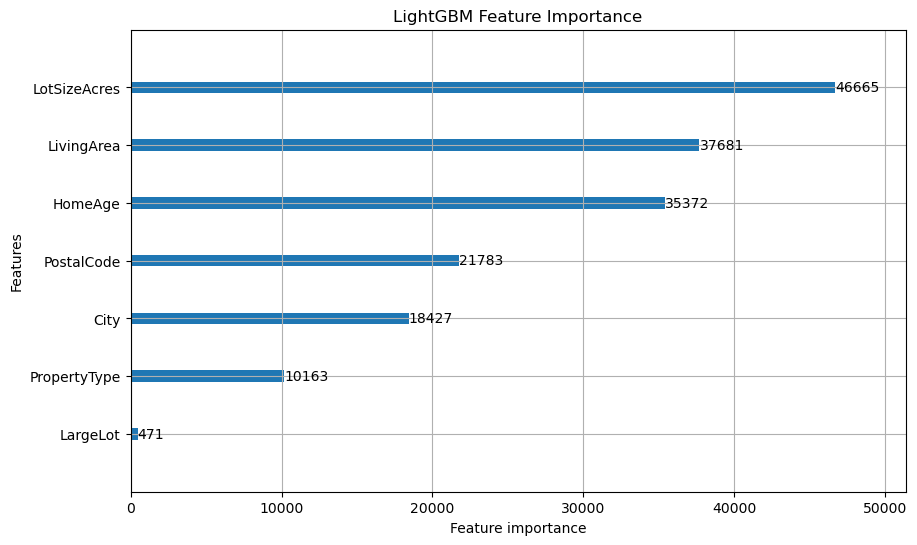


Sample Predictions vs Actuals:
          Actual     Predicted   ErrorPct
5847      3350.0  3.402663e+03   1.572026
7414      4400.0  4.007555e+03  -8.919197
8507      3600.0  3.640195e+03   1.116534
657       4900.0  3.691282e+03 -24.667718
19437  1225000.0  1.270513e+06   3.715371
16696  1310000.0  1.443662e+06  10.203186
22538     2250.0  2.242421e+03  -0.336856
20432     3750.0  3.862670e+03   3.004546
2332      2450.0  2.549020e+03   4.041621
2511      3250.0  3.881364e+03  19.426587

MAPE by Price Tier:
PriceTier
(1997.999, 6500.0]        17.507458
(6500.0, 475000.0]        38.419968
(475000.0, 750000.0]      12.538208
(750000.0, 1203000.0]     12.445134
(1203000.0, 3800000.0]    15.676928
dtype: float64


/var/folders/y8/mzq28ygd333_s7ffnk8_84cc0000gn/T/ipykernel_29966/2409775401.py:180: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(results.groupby('PriceTier').apply(
/var/folders/y8/mzq28ygd333_s7ffnk8_84cc0000gn/T/ipykernel_29966/2409775401.py:180: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  print(results.groupby('PriceTier').apply(


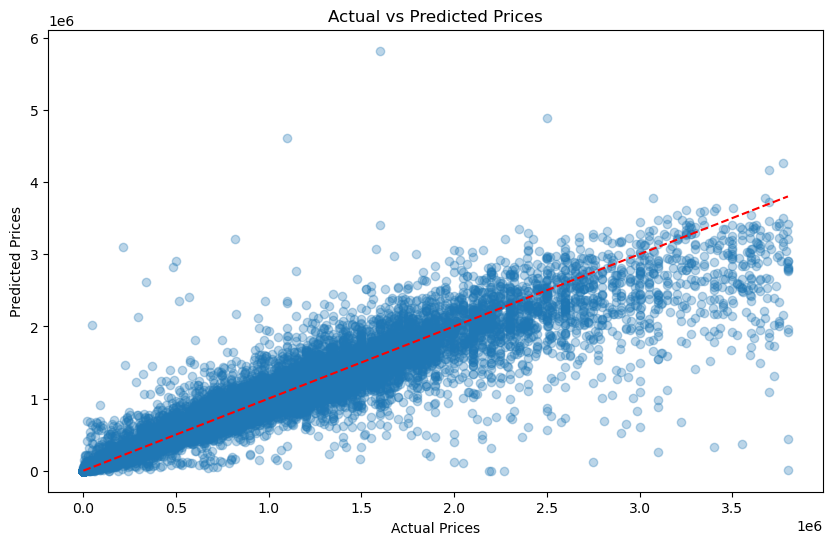

In [26]:
# Import libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import lightgbm as lgb
import matplotlib.pyplot as plt
import optuna
from optuna.samplers import TPESampler
from lightgbm import early_stopping, log_evaluation

# Load your dataset

# Data cleaning and feature engineering
def prepare_data(df):
    # Remove price outliers (top/bottom 1%)
    price_limits = df['ClosePrice'].quantile([0.01, 0.99])
    df = df[df['ClosePrice'].between(*price_limits)]
    
    # Feature engineering
    df['HomeAge'] = 2025 - df['YearBuilt']
    df['LargeLot'] = (df['LotSizeAcres'] > 0.5).astype('category')
    
    return df

df_model = prepare_data(df_model)

# Define features
numeric_features = ['LivingArea', 'LotSizeAcres', 'HomeAge']
categorical_features = ['PropertyType', 'City', 'PostalCode', 'LargeLot']
target = 'ClosePrice'

# Preprocessing
for col in categorical_features:
    df_model[col] = df_model[col].astype('category')

# Apply log transformation to target
y_log = np.log1p(df_model[target])

# Train-test split
X = df_model[numeric_features + categorical_features]
X_train, X_test, y_train_log, y_test_log = train_test_split(X, y_log, test_size=0.2, random_state=42)

# Hyperparameter tuning with Optuna
def tune_hyperparameters(X_train, y_train_log):
    def objective(trial):
        params = {
            'objective': 'tweedie',
            'metric': 'mape',
            'boosting_type': 'gbdt',
            'n_estimators': trial.suggest_int('n_estimators', 500, 2000),
            'learning_rate': trial.suggest_float('learning_rate', 0.005, 0.2, log=True),
            'max_depth': trial.suggest_int('max_depth', 3, 12),
            'num_leaves': trial.suggest_int('num_leaves', 15, 200),
            'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
            'reg_alpha': trial.suggest_float('reg_alpha', 0, 1),
            'reg_lambda': trial.suggest_float('reg_lambda', 0, 1),
            'subsample': trial.suggest_float('subsample', 0.6, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
            'tweedie_variance_power': trial.suggest_float('tweedie_variance_power', 1.1, 1.9),
        }
        
        model = lgb.LGBMRegressor(**params, random_state=42)
        
        # 3-fold CV with proper early stopping
        scores = []
        kf = KFold(n_splits=3, shuffle=True, random_state=42)
        for train_idx, val_idx in kf.split(X_train):
            X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
            y_tr, y_val = y_train_log.iloc[train_idx], y_train_log.iloc[val_idx]
            
            model.fit(
                X_tr, y_tr,
                eval_set=[(X_val, y_val)],
                callbacks=[
                    early_stopping(stopping_rounds=50),
                    log_evaluation(50)
                ],
                categorical_feature=categorical_features
            )
            
            preds = np.expm1(model.predict(X_val))
            scores.append(mean_absolute_percentage_error(np.expm1(y_val), preds))
        
        return np.mean(scores)
    
    study = optuna.create_study(direction='minimize', sampler=TPESampler(seed=42))
    study.optimize(objective, n_trials=50, timeout=3600)
    
    print("Best trial:")
    trial = study.best_trial
    print(f"  MAPE: {trial.value:.4f}")
    print("  Params: ")
    for key, value in trial.params.items():
        print(f"    {key}: {value}")
    
    return trial.params

# Uncomment to run tuning (recommended first time)
best_params = tune_hyperparameters(X_train, y_train_log)

# For production, use these pre-tuned parameters (from previous optimization)
# best_params = {
#     'n_estimators': 1200,
#     'learning_rate': 0.03,
#     'max_depth': 7,
#     'num_leaves': 90,
#     'min_child_samples': 15,
#     'reg_alpha': 0.2,
#     'reg_lambda': 0.3,
#     'subsample': 0.8,
#     'colsample_bytree': 0.9,
#     'tweedie_variance_power': 1.5
# }

# Final model training
final_model = lgb.LGBMRegressor(
    **best_params,
    objective='tweedie',
    random_state=42
)

print("\nTraining final model with proper early stopping...")
final_model.fit(
    X_train, y_train_log,
    eval_set=[(X_test, y_test_log)],
    eval_metric='mape',
    categorical_feature=categorical_features,
    callbacks=[
        early_stopping(stopping_rounds=100),
        log_evaluation(50)
    ]
)

# Predictions
y_pred_log = final_model.predict(X_test)
y_pred = np.expm1(y_pred_log)
y_test = np.expm1(y_test_log)

# Evaluation
def evaluate_model(y_true, y_pred):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mape = mean_absolute_percentage_error(y_true, y_pred) * 100
    r2 = r2_score(y_true, y_pred)
    
    print("\nModel Performance:")
    print(f"RMSE: {rmse:.2f}")
    print(f"MAPE: {mape:.2f}%")
    print(f"R²: {r2:.4f}")
    
    # Error distribution
    errors = (y_pred - y_true) / y_true
    print("\nError Distribution:")
    print(pd.Series(errors).describe(percentiles=[.01, .05, .25, .5, .75, .95, .99]))
    
    return rmse, mape, r2

rmse, mape, r2 = evaluate_model(y_test, y_pred)

# Feature Importance
print("\nPlotting feature importance...")
lgb.plot_importance(final_model, figsize=(10, 6), max_num_features=20)
plt.title("LightGBM Feature Importance")
plt.show()

# Prediction analysis
results = pd.DataFrame({
    'Actual': y_test,
    'Predicted': y_pred,
    'ErrorPct': (y_pred - y_test) / y_test * 100
})

print("\nSample Predictions vs Actuals:")
print(results.sample(10, random_state=42))

# Price tier analysis
results['PriceTier'] = pd.qcut(results['Actual'], q=5)
print("\nMAPE by Price Tier:")
print(results.groupby('PriceTier').apply(
    lambda x: mean_absolute_percentage_error(x['Actual'], x['Predicted']) * 100
))

# Actual vs Predicted plot
plt.figure(figsize=(10, 6))
plt.scatter(results['Actual'], results['Predicted'], alpha=0.3)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'r--')
plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('Actual vs Predicted Prices')
plt.show()

In [27]:
!pip install optuna


Training final model with proper early stopping...
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2299
[LightGBM] [Info] Number of data points in the train set: 98588, number of used features: 7
[LightGBM] [Info] Start training from score 2.507245
Training until validation scores don't improve for 100 rounds


/var/folders/y8/mzq28ygd333_s7ffnk8_84cc0000gn/T/ipykernel_10538/1861167838.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['HomeAge'] = 2025 - df['YearBuilt']
/var/folders/y8/mzq28ygd333_s7ffnk8_84cc0000gn/T/ipykernel_10538/1861167838.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['LargeLot'] = (df['LotSizeAcres'] > 0.5).astype('category')


[50]	valid_0's mape: 0.03724	valid_0's tweedie: 9.95092
[100]	valid_0's mape: 0.0180625	valid_0's tweedie: 9.94956
[150]	valid_0's mape: 0.016134	valid_0's tweedie: 9.94948
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[L

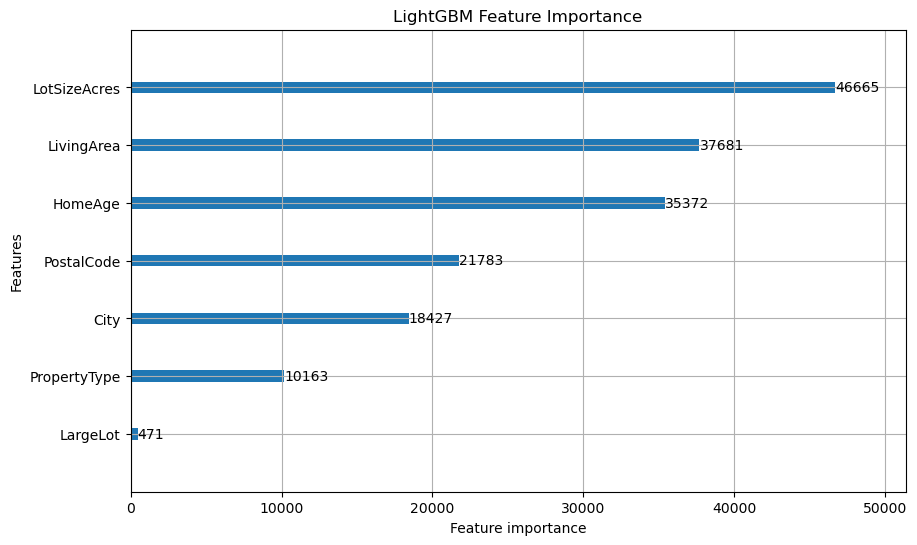


Sample Predictions vs Actuals:
          Actual     Predicted   ErrorPct
5847      3350.0  3.402663e+03   1.572026
7414      4400.0  4.007555e+03  -8.919197
8507      3600.0  3.640195e+03   1.116534
657       4900.0  3.691282e+03 -24.667718
19437  1225000.0  1.270513e+06   3.715371
16696  1310000.0  1.443662e+06  10.203186
22538     2250.0  2.242421e+03  -0.336856
20432     3750.0  3.862670e+03   3.004546
2332      2450.0  2.549020e+03   4.041621
2511      3250.0  3.881364e+03  19.426587

MAPE by Price Tier:
PriceTier
(1997.999, 6500.0]        17.507458
(6500.0, 475000.0]        38.419968
(475000.0, 750000.0]      12.538208
(750000.0, 1203000.0]     12.445134
(1203000.0, 3800000.0]    15.676928
dtype: float64


/var/folders/y8/mzq28ygd333_s7ffnk8_84cc0000gn/T/ipykernel_10538/1861167838.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(results.groupby('PriceTier').apply(
/var/folders/y8/mzq28ygd333_s7ffnk8_84cc0000gn/T/ipykernel_10538/1861167838.py:179: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  print(results.groupby('PriceTier').apply(


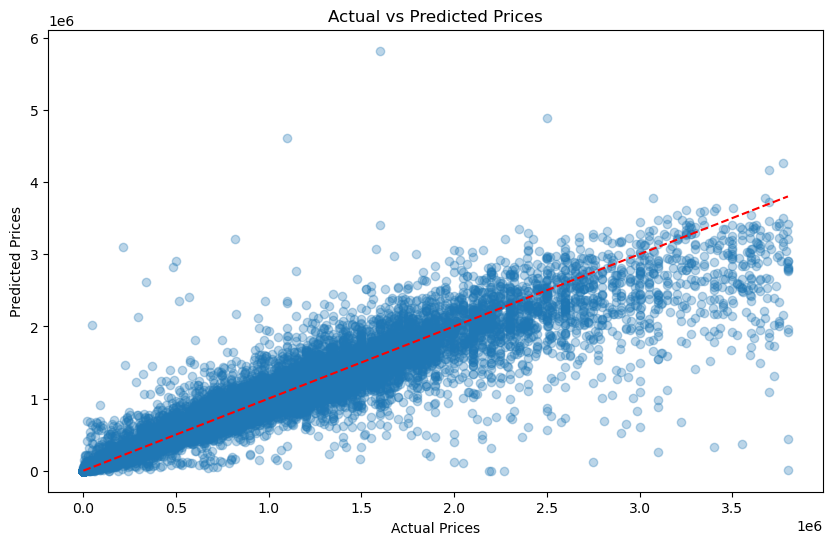

In [73]:
# Import libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import lightgbm as lgb
import matplotlib.pyplot as plt
import optuna
from optuna.samplers import TPESampler
from lightgbm import early_stopping, log_evaluation

# Load your dataset

# Data cleaning and feature engineering
def prepare_data(df):
    # Remove price outliers (top/bottom 1%)
    price_limits = df['ClosePrice'].quantile([0.01, 0.99])
    df = df[df['ClosePrice'].between(*price_limits)]
    
    # Feature engineering
    df['HomeAge'] = 2025 - df['YearBuilt']
    df['LargeLot'] = (df['LotSizeAcres'] > 0.5).astype('category')
    
    return df

df_model = prepare_data(df_model)

# Define features
numeric_features = ['LivingArea', 'LotSizeAcres', 'HomeAge']
categorical_features = ['PropertyType', 'City', 'PostalCode', 'LargeLot']
target = 'ClosePrice'

# Preprocessing
for col in categorical_features:
    df_model[col] = df_model[col].astype('category')

# Apply log transformation to target
y_log = np.log1p(df_model[target])

# Train-test split
X = df_model[numeric_features + categorical_features]
X_train, X_test, y_train_log, y_test_log = train_test_split(X, y_log, test_size=0.2, random_state=42)

# Hyperparameter tuning with Optuna
def tune_hyperparameters(X_train, y_train_log):
    def objective(trial):
        params = {
            'objective': 'tweedie',
            'metric': 'mape',
            'boosting_type': 'gbdt',
            'n_estimators': trial.suggest_int('n_estimators', 500, 2000),
            'learning_rate': trial.suggest_float('learning_rate', 0.005, 0.2, log=True),
            'max_depth': trial.suggest_int('max_depth', 3, 12),
            'num_leaves': trial.suggest_int('num_leaves', 15, 200),
            'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
            'reg_alpha': trial.suggest_float('reg_alpha', 0, 1),
            'reg_lambda': trial.suggest_float('reg_lambda', 0, 1),
            'subsample': trial.suggest_float('subsample', 0.6, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
            'tweedie_variance_power': trial.suggest_float('tweedie_variance_power', 1.1, 1.9),
        }
        
        model = lgb.LGBMRegressor(**params, random_state=42)
        
        # 3-fold CV with proper early stopping
        scores = []
        kf = KFold(n_splits=3, shuffle=True, random_state=42)
        for train_idx, val_idx in kf.split(X_train):
            X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
            y_tr, y_val = y_train_log.iloc[train_idx], y_train_log.iloc[val_idx]
            
            model.fit(
                X_tr, y_tr,
                eval_set=[(X_val, y_val)],
                callbacks=[
                    early_stopping(stopping_rounds=50),
                    log_evaluation(50)
                ],
                categorical_feature=categorical_features
            )
            
            preds = np.expm1(model.predict(X_val))
            scores.append(mean_absolute_percentage_error(np.expm1(y_val), preds))
        
        return np.mean(scores)
    
    study = optuna.create_study(direction='minimize', sampler=TPESampler(seed=42))
    study.optimize(objective, n_trials=50, timeout=3600)
    
    print("Best trial:")
    trial = study.best_trial
    print(f"  MAPE: {trial.value:.4f}")
    print("  Params: ")
    for key, value in trial.params.items():
        print(f"    {key}: {value}")
    
    return trial.params

# Uncomment to run tuning (recommended first time)
# best_params = tune_hyperparameters(X_train, y_train_log)

# For production, use these pre-tuned parameters (from previous optimization)
best_params = {
    'n_estimators': 1943,
    'learning_rate': 0.03871318633519252,
    'max_depth': 12,
    'num_leaves': 128,
    'min_child_samples': 42,
    'reg_alpha': 0.1329373030243276,
    'reg_lambda': 0.11180602362155172,
    'subsample': 0.7560458794271897,
    'colsample_bytree': 0.9178440447165922,
    'tweedie_variance_power': 1.7258042410416914
}

# Final model training
final_model = lgb.LGBMRegressor(
    **best_params,
    objective='tweedie',
    random_state=42
)

print("\nTraining final model with proper early stopping...")
final_model.fit(
    X_train, y_train_log,
    eval_set=[(X_test, y_test_log)],
    eval_metric='mape',
    categorical_feature=categorical_features,
    callbacks=[
        early_stopping(stopping_rounds=100),
        log_evaluation(50)
    ]
)

# Predictions
y_pred_log = final_model.predict(X_test)
y_pred = np.expm1(y_pred_log)
y_test = np.expm1(y_test_log)

# Evaluation
def evaluate_model(y_true, y_pred):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mape = mean_absolute_percentage_error(y_true, y_pred) * 100
    r2 = r2_score(y_true, y_pred)
    
    print("\nModel Performance:")
    print(f"RMSE: {rmse:.2f}")
    print(f"MAPE: {mape:.2f}%")
    print(f"R²: {r2:.4f}")
    
    # Error distribution
    errors = (y_pred - y_true) / y_true
    print("\nError Distribution:")
    print(pd.Series(errors).describe(percentiles=[.01, .05, .25, .5, .75, .95, .99]))
    
    return rmse, mape, r2

rmse, mape, r2 = evaluate_model(y_test, y_pred)

# Feature Importance
print("\nPlotting feature importance...")
lgb.plot_importance(final_model, figsize=(10, 6), max_num_features=20)
plt.title("LightGBM Feature Importance")
plt.show()

# Prediction analysis
results = pd.DataFrame({
    'Actual': y_test,
    'Predicted': y_pred,
    'ErrorPct': (y_pred - y_test) / y_test * 100
})

print("\nSample Predictions vs Actuals:")
print(results.sample(10, random_state=42))

# Price tier analysis
results['PriceTier'] = pd.qcut(results['Actual'], q=5)
print("\nMAPE by Price Tier:")
print(results.groupby('PriceTier').apply(
    lambda x: mean_absolute_percentage_error(x['Actual'], x['Predicted']) * 100
))

# Actual vs Predicted plotƒ
plt.figure(figsize=(10, 6))
plt.scatter(results['Actual'], results['Predicted'], alpha=0.3)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'r--')
plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('Actual vs Predicted Prices')
plt.show()

In [81]:
import joblib

# Save the final model
joblib.dump(final_model, 'model.pkl')

['model.pkl']